In [1]:
import pandas as pd
from rdkit import Chem
import seaborn as sns
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt


# Combining data

Combining datasets

In [2]:
# drop the rest 
keep_cols_all = ["CANONICAL_SMILES", "INCHIKEY", "active", "dataset", "data_type", "common_name", "action_type"]


# AID 1347003

In [3]:
aid1347033 = pd.read_csv("processed/AID_1347033.csv")

In [4]:
aid1347033.head()

,CANONICAL_SMILES,INCHIKEY,PUBCHEM_ACTIVITY_OUTCOME,PUBCHEM_CID,dataset,data_type,active,common_name,action_type
0,CC[C@H]1CN2CCc3cc(OC)c(OC)cc3[C@@H]2C[C@@H]1C[...,AUVVAXYIELKVAI-CKBKHPSWSA-N,Active,10219.0,aid1347033,assay,True,NaN,agonist
1,C[C@@]12C(=O)OC(=O)[C@]1(C)C1CCC2O1,DHZBEENLJMYSHQ-OBDNUKKESA-N,Active,6708701.0,aid1347033,assay,True,NaN,agonist
2,N=C(Nc1ccccc1)Nc1ccccc1,OWRCNXZUPFZXOS-UHFFFAOYSA-N,Active,7594.0,aid1347033,assay,True,NaN,agonist
3,C=CC(=O)Nc1cc2c(Nc3ccc(F)c(Cl)c3)ncnc2cc1OCCCN...,OMZCMEYTWSXEPZ-UHFFFAOYSA-N,Active,156414.0,aid1347033,assay,True,NaN,agonist
4,O=c1cc(-c2ccc(O)cc2)oc2cc(O)cc(O)c12,KZNIFHPLKGYRTM-UHFFFAOYSA-N,Active,5280443.0,aid1347033,assay,True,NaN,agonist


In [5]:
aid1347033_actives = aid1347033.query("active == True")
aid1347033_actives = aid1347033_actives[keep_cols_all]
aid1347033_actives

,CANONICAL_SMILES,INCHIKEY,active,dataset,data_type,common_name,action_type
0,CC[C@H]1CN2CCc3cc(OC)c(OC)cc3[C@@H]2C[C@@H]1C[...,AUVVAXYIELKVAI-CKBKHPSWSA-N,True,aid1347033,assay,NaN,agonist
1,C[C@@]12C(=O)OC(=O)[C@]1(C)C1CCC2O1,DHZBEENLJMYSHQ-OBDNUKKESA-N,True,aid1347033,assay,NaN,agonist
2,N=C(Nc1ccccc1)Nc1ccccc1,OWRCNXZUPFZXOS-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist
3,C=CC(=O)Nc1cc2c(Nc3ccc(F)c(Cl)c3)ncnc2cc1OCCCN...,OMZCMEYTWSXEPZ-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist
4,O=c1cc(-c2ccc(O)cc2)oc2cc(O)cc(O)c12,KZNIFHPLKGYRTM-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist
...,...,...,...,...,...,...,...
2072,ClC1=C(Cl)C2(Cl)C3C(Cl)C=CC3C1(Cl)C2(Cl)Cl,FRCCEHPWNOQAEU-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist
2073,O=C(CCc1ccc(O)cc1)c1c(O)cc(O)cc1O,VGEREEWJJVICBM-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist
2074,Brc1ccc(Oc2ccccc2)cc1,JDUYPUMQALQRCN-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist
2075,CCCCCCCCCOCC1CO1,KEKXMAURKVLACV-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist


# AID 434939

In [6]:
aid434939 = pd.read_csv("./processed/AID_434939.csv")

In [7]:
aid434939_actives = aid434939.query("active == True")
aid434939_actives = aid434939_actives[keep_cols_all]

In [8]:
aid434939_actives

,CANONICAL_SMILES,INCHIKEY,active,dataset,data_type,common_name,action_type
0,CCn1c2ccccc2c2cc(NC(=O)CSc3nnnn3-c3ccccc3)ccc21,PKWBGMCLPVXLSO-UHFFFAOYSA-N,True,aid434939,assay,NaN,agonist
1,Cc1cccc(C(=O)NC(C(=O)Nc2ncc(C)s2)C(C)C)c1,ASGCTENTJVTZBM-UHFFFAOYSA-N,True,aid434939,assay,NaN,agonist
2,COc1ccccc1-c1sc2cc3c(cc2c1C#CC1(O)CCCCC1)OCO3,KAIBRZZQPOEOOJ-UHFFFAOYSA-N,True,aid434939,assay,NaN,agonist
3,C=C1C(=O)O[C@@H]2C[C@@H](C)C3=CCC(=O)[C@@]3(C)...,YUHGCHCTADWTAC-LAIRZBGTSA-N,True,aid434939,assay,NaN,agonist
4,Cn1cccc1/C=N/n1c(-c2ccc(C(C)(C)C)cc2)n[nH]c1=S,GGKUFTYXGKDNBZ-XDHOZWIPSA-N,True,aid434939,assay,NaN,agonist
...,...,...,...,...,...,...,...
2012,CN(C)c1ccc(/C=N\NC(=O)c2csnn2)cc1,GFRVDRMYBYYYSE-QPEQYQDCSA-N,True,aid434939,assay,NaN,agonist
2013,Cc1c(C(=O)N/N=C/C(C)C)[nH]c2c([N+](=O)[O-])cccc12,NWCXILSGOZBVPS-VIZOYTHASA-N,True,aid434939,assay,NaN,agonist
2014,N=C1S/C(=C\c2ccco2)C(=O)N1c1nccs1,RJHAJQSWEUEPCY-FFIYZWDUSA-N,True,aid434939,assay,NaN,agonist
2015,O=C1c2ccccc2C(=O)N1CCc1ccccn1,XDSOQPQMYBPJND-UHFFFAOYSA-N,True,aid434939,assay,NaN,agonist


# AID 720659

In [11]:
aid720659 = pd.read_csv("./processed/AID_720659.csv")

In [12]:
aid720659_actives = aid720659.query("active == True")
aid720659_actives = aid720659_actives[keep_cols_all]

# Chembl

There is only a single set of compounds in ChEMBL with substrate activity explicitly marked 



In [18]:
chembl_actives = pd.read_csv("processed/chembl_active.csv")
chembl_actives.head()

,CANONICAL_SMILES,INCHIKEY,common_name,dataset,active,action_type
0,OCCN1CCN(CC/C=C2/c3ccccc3Sc3ccc(Cl)cc32)CC1,WFPIAZLQTJBIFN-DVZOWYKESA-N,ZUCLOPENTHIXOL,ChEMBL_curated,True,agonist
1,CN(C)CCOC1=Cc2ccccc2Sc2ccc(Cl)cc21,HDOZVRUNCMBHFH-UHFFFAOYSA-N,ZOTEPINE,ChEMBL_curated,True,agonist
2,CN1CCN(C(=O)OC2c3nccnc3C(=O)N2c2ccc(Cl)cn2)CC1,GBBSUAFBMRNDJC-UHFFFAOYSA-N,ZOPICLONE,ChEMBL_curated,True,agonist
3,NS(=O)(=O)Cc1noc2ccccc12,UBQNRHZMVUUOMG-UHFFFAOYSA-N,ZONISAMIDE,ChEMBL_curated,True,agonist
4,Cc1cc(CC(=O)O)n(C)c1C(=O)c1ccc(Cl)cc1,ZXVNMYWKKDOREA-UHFFFAOYSA-N,ZOMEPIRAC,ChEMBL_curated,True,agonist


# FDA approved

Compounds the FDA really reccomends you try

In [15]:
fda = pd.read_csv("./FDA/fda.csv")

In [16]:
fda

,CANONICAL_SMILES,active,common_name,action_type,FDA_recommended,dataset,INCHIKEY
0,C[C@H]1/C=C/C=C(\C(=O)NC2=C(C(=C3C(=C2O)C(=C(C...,True,rifampicin,agonist,True,FDA,JQXXHWHPUNPDRT-WLSIYKJHSA-N
1,C1=CC=C2C(=C1)C=CC3=CC=CC=C3N2C(=O)N,True,carbamazepine,agonist,True,FDA,FFGPTBGBLSHEPO-UHFFFAOYSA-N
2,C1=CC=C(C=C1)C2(C(=O)NC(=O)N2)C3=CC=CC=C3,True,phenytoin,agonist,True,FDA,CXOFVDLJLONNDW-UHFFFAOYSA-N


# Flockheart table

In [13]:
flockheart = pd.read_csv("./processed/flockheart.csv")
flockheart.drop(columns="SMILES", inplace=True)

# Combine everything


## NOTE

common name being blank is not that these compounds do not have a common name, but that they need to be pulled from pubchem

In [19]:
combined_literature = pd.concat([aid1347033_actives, aid434939_actives, aid720659_actives, fda, flockheart, chembl_actives])
combined_literature

,CANONICAL_SMILES,INCHIKEY,active,dataset,data_type,common_name,action_type,FDA_recommended
0,CC[C@H]1CN2CCc3cc(OC)c(OC)cc3[C@@H]2C[C@@H]1C[...,AUVVAXYIELKVAI-CKBKHPSWSA-N,True,aid1347033,assay,NaN,agonist,NaN
1,C[C@@]12C(=O)OC(=O)[C@]1(C)C1CCC2O1,DHZBEENLJMYSHQ-OBDNUKKESA-N,True,aid1347033,assay,NaN,agonist,NaN
2,N=C(Nc1ccccc1)Nc1ccccc1,OWRCNXZUPFZXOS-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN
3,C=CC(=O)Nc1cc2c(Nc3ccc(F)c(Cl)c3)ncnc2cc1OCCCN...,OMZCMEYTWSXEPZ-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN
4,O=c1cc(-c2ccc(O)cc2)oc2cc(O)cc(O)c12,KZNIFHPLKGYRTM-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN
...,...,...,...,...,...,...,...,...
3519,CC(C)(O)CCc1cccn2c(C3(c4ccc(Cl)cc4)CC3)nnc12,YPSWZIMENUQPDQ-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN
3520,CCOc1cccc(-n2ncnc2C2C(C)=Nc3cc(C(F)(F)F)nn3[C@...,ULKRCKWCCPFSLK-BPGUCPLFSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN
3521,NS(=O)(=O)c1cc(NC(=O)Cc2ccccc2Cl)ccc1Oc1ccccc1Cl,NAWLRQNLXWAEQQ-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN
3522,CC(C)c1cc(-c2ccc(C(F)(F)F)cc2CN2C(=O)O[C@H](c3...,RIYNILFKRCWZEO-SXBQZSJRSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN


In [14]:
# combined_literature["FDA_recommended"] = combined_literature["FDA_recommended"].fillna(False)

In [20]:
combined_literature.INCHIKEY.duplicated().sum()  # close same result with SMILES

np.int64(890)

In [21]:
combined_literature.dropna(subset="INCHIKEY", inplace=True)

In [22]:
combined_literature_chembl = combined_literature

In [23]:
combined_literature_chembl.FDA_recommended.value_counts()

FDA_recommended
True    3
Name: count, dtype: int64

In [24]:
combined_literature_chembl.dataset.value_counts()

dataset
ChEMBL_curated    3524
aid1347033        2052
aid434939         2017
aid720659          263
flockheart          24
FDA                  3
Name: count, dtype: int64

In [25]:
combined_literature_chembl.INCHIKEY.duplicated().sum()

np.int64(864)

In [26]:
combined_literature_chembl.INCHIKEY.isna().sum()

np.int64(0)

In [27]:
combined_literature_chembl

,CANONICAL_SMILES,INCHIKEY,active,dataset,data_type,common_name,action_type,FDA_recommended
0,CC[C@H]1CN2CCc3cc(OC)c(OC)cc3[C@@H]2C[C@@H]1C[...,AUVVAXYIELKVAI-CKBKHPSWSA-N,True,aid1347033,assay,NaN,agonist,NaN
1,C[C@@]12C(=O)OC(=O)[C@]1(C)C1CCC2O1,DHZBEENLJMYSHQ-OBDNUKKESA-N,True,aid1347033,assay,NaN,agonist,NaN
2,N=C(Nc1ccccc1)Nc1ccccc1,OWRCNXZUPFZXOS-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN
3,C=CC(=O)Nc1cc2c(Nc3ccc(F)c(Cl)c3)ncnc2cc1OCCCN...,OMZCMEYTWSXEPZ-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN
4,O=c1cc(-c2ccc(O)cc2)oc2cc(O)cc(O)c12,KZNIFHPLKGYRTM-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN
...,...,...,...,...,...,...,...,...
3519,CC(C)(O)CCc1cccn2c(C3(c4ccc(Cl)cc4)CC3)nnc12,YPSWZIMENUQPDQ-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN
3520,CCOc1cccc(-n2ncnc2C2C(C)=Nc3cc(C(F)(F)F)nn3[C@...,ULKRCKWCCPFSLK-BPGUCPLFSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN
3521,NS(=O)(=O)c1cc(NC(=O)Cc2ccccc2Cl)ccc1Oc1ccccc1Cl,NAWLRQNLXWAEQQ-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN
3522,CC(C)c1cc(-c2ccc(C(F)(F)F)cc2CN2C(=O)O[C@H](c3...,RIYNILFKRCWZEO-SXBQZSJRSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN


In [28]:
appears = combined_literature_chembl.groupby("INCHIKEY")["dataset"].nunique().reset_index(name="appears_in_N_datasets")
appears.set_index("INCHIKEY")

,appears_in_N_datasets
INCHIKEY,
AADCDMQTJNYOSS-LBPRGKRZSA-N,1
AADOHPJLNNJGGG-UHFFFAOYSA-N,1
AAEVYOVXGOFMJO-UHFFFAOYSA-N,2
AAHNBILIYONQLX-UHFFFAOYSA-N,1
AAKJLRGGTJKAMG-UHFFFAOYSA-N,2
...,...
ZZPYRWQPKUSUJH-UHFFFAOYSA-N,1
ZZRDAWZXJBVQSO-UHFFFAOYSA-N,1
ZZUFCTLCJUWOSV-UHFFFAOYSA-N,1


In [29]:
appears.isna().sum()

INCHIKEY                 0
appears_in_N_datasets    0
dtype: int64

<Axes: xlabel='appears_in_N_datasets', ylabel='count'>

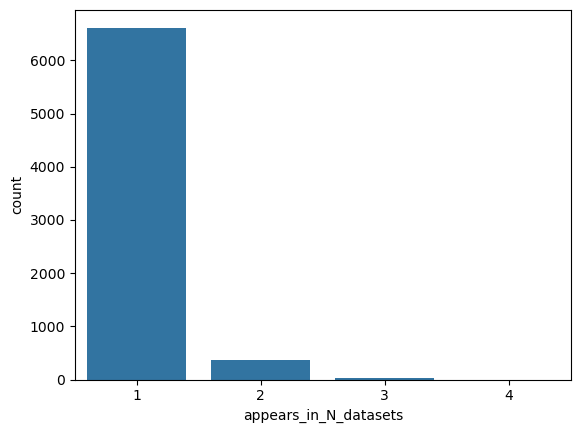

In [30]:
sns.countplot(data=appears, x="appears_in_N_datasets")

In [31]:
combined_literature_chembl_w_counts = combined_literature_chembl.merge(appears, on="INCHIKEY")
combined_literature_chembl_w_counts

,CANONICAL_SMILES,INCHIKEY,active,dataset,data_type,common_name,action_type,FDA_recommended,appears_in_N_datasets
0,CC[C@H]1CN2CCc3cc(OC)c(OC)cc3[C@@H]2C[C@@H]1C[...,AUVVAXYIELKVAI-CKBKHPSWSA-N,True,aid1347033,assay,NaN,agonist,NaN,2
1,C[C@@]12C(=O)OC(=O)[C@]1(C)C1CCC2O1,DHZBEENLJMYSHQ-OBDNUKKESA-N,True,aid1347033,assay,NaN,agonist,NaN,1
2,N=C(Nc1ccccc1)Nc1ccccc1,OWRCNXZUPFZXOS-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,1
3,C=CC(=O)Nc1cc2c(Nc3ccc(F)c(Cl)c3)ncnc2cc1OCCCN...,OMZCMEYTWSXEPZ-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,1
4,O=c1cc(-c2ccc(O)cc2)oc2cc(O)cc(O)c12,KZNIFHPLKGYRTM-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,2
...,...,...,...,...,...,...,...,...,...
7878,CC(C)(O)CCc1cccn2c(C3(c4ccc(Cl)cc4)CC3)nnc12,YPSWZIMENUQPDQ-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN,1
7879,CCOc1cccc(-n2ncnc2C2C(C)=Nc3cc(C(F)(F)F)nn3[C@...,ULKRCKWCCPFSLK-BPGUCPLFSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN,1
7880,NS(=O)(=O)c1cc(NC(=O)Cc2ccccc2Cl)ccc1Oc1ccccc1Cl,NAWLRQNLXWAEQQ-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN,1
7881,CC(C)c1cc(-c2ccc(C(F)(F)F)cc2CN2C(=O)O[C@H](c3...,RIYNILFKRCWZEO-SXBQZSJRSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN,1


In [32]:
df_dummies = pd.get_dummies(combined_literature_chembl_w_counts['dataset'], prefix='dataset').join(combined_literature_chembl_w_counts["INCHIKEY"])
df_dummies

,dataset_ChEMBL_curated,dataset_FDA,dataset_aid1347033,dataset_aid434939,dataset_aid720659,dataset_flockheart,INCHIKEY
0,False,False,True,False,False,False,AUVVAXYIELKVAI-CKBKHPSWSA-N
1,False,False,True,False,False,False,DHZBEENLJMYSHQ-OBDNUKKESA-N
2,False,False,True,False,False,False,OWRCNXZUPFZXOS-UHFFFAOYSA-N
3,False,False,True,False,False,False,OMZCMEYTWSXEPZ-UHFFFAOYSA-N
4,False,False,True,False,False,False,KZNIFHPLKGYRTM-UHFFFAOYSA-N
...,...,...,...,...,...,...,...
7878,True,False,False,False,False,False,YPSWZIMENUQPDQ-UHFFFAOYSA-N
7879,True,False,False,False,False,False,ULKRCKWCCPFSLK-BPGUCPLFSA-N
7880,True,False,False,False,False,False,NAWLRQNLXWAEQQ-UHFFFAOYSA-N
7881,True,False,False,False,False,False,RIYNILFKRCWZEO-SXBQZSJRSA-N


In [33]:
df_result = df_dummies.groupby('INCHIKEY').max().reset_index()
df_result = df_result.set_index("INCHIKEY")

In [34]:
# cat_dataname = combined_literature_chembl.groupby("INCHIKEY")["dataset"].apply(lambda x: "_+_".join(x)).reset_index(name="dataset_comb").set_index("INCHIKEY")
# cat_dataname

In [35]:
combined_literature_chembl_w_counts = combined_literature_chembl_w_counts.merge(df_result, on="INCHIKEY")
combined_literature_chembl_w_counts

,CANONICAL_SMILES,INCHIKEY,active,dataset,data_type,common_name,action_type,FDA_recommended,appears_in_N_datasets,dataset_ChEMBL_curated,dataset_FDA,dataset_aid1347033,dataset_aid434939,dataset_aid720659,dataset_flockheart
0,CC[C@H]1CN2CCc3cc(OC)c(OC)cc3[C@@H]2C[C@@H]1C[...,AUVVAXYIELKVAI-CKBKHPSWSA-N,True,aid1347033,assay,NaN,agonist,NaN,2,True,False,True,False,False,False
1,C[C@@]12C(=O)OC(=O)[C@]1(C)C1CCC2O1,DHZBEENLJMYSHQ-OBDNUKKESA-N,True,aid1347033,assay,NaN,agonist,NaN,1,False,False,True,False,False,False
2,N=C(Nc1ccccc1)Nc1ccccc1,OWRCNXZUPFZXOS-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,1,False,False,True,False,False,False
3,C=CC(=O)Nc1cc2c(Nc3ccc(F)c(Cl)c3)ncnc2cc1OCCCN...,OMZCMEYTWSXEPZ-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,1,False,False,True,False,False,False
4,O=c1cc(-c2ccc(O)cc2)oc2cc(O)cc(O)c12,KZNIFHPLKGYRTM-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,2,False,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7878,CC(C)(O)CCc1cccn2c(C3(c4ccc(Cl)cc4)CC3)nnc12,YPSWZIMENUQPDQ-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN,1,True,False,False,False,False,False
7879,CCOc1cccc(-n2ncnc2C2C(C)=Nc3cc(C(F)(F)F)nn3[C@...,ULKRCKWCCPFSLK-BPGUCPLFSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN,1,True,False,False,False,False,False
7880,NS(=O)(=O)c1cc(NC(=O)Cc2ccccc2Cl)ccc1Oc1ccccc1Cl,NAWLRQNLXWAEQQ-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN,1,True,False,False,False,False,False
7881,CC(C)c1cc(-c2ccc(C(F)(F)F)cc2CN2C(=O)O[C@H](c3...,RIYNILFKRCWZEO-SXBQZSJRSA-N,True,ChEMBL_curated,NaN,NaN,agonist,NaN,1,True,False,False,False,False,False


In [36]:
combined_literature_chembl_w_counts.action_type.value_counts()

action_type
agonist    7883
Name: count, dtype: int64

In [37]:
combined_literature_chembl_w_counts.INCHIKEY.nunique()

7019

In [38]:
combined_literature_chembl_w_counts['common_name'].isna().sum()

np.int64(6759)

In [39]:
# we can just sort by N_datasets as no specific chembl curation to get all the chembl data at the top, then uniquify on INCHIKEY

combined_literature_chembl_w_counts.sort_values(["appears_in_N_datasets"], ascending=[False],  inplace=True)


In [40]:
# fill common name from gropupby 
combined_literature_chembl_w_counts['common_name'] = combined_literature_chembl_w_counts.groupby('INCHIKEY')['common_name'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))


/tmp/ipykernel_111870/1877288904.py:2: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  combined_literature_chembl_w_counts['common_name'] = combined_literature_chembl_w_counts.groupby('INCHIKEY')['common_name'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))
/tmp/ipykernel_111870/1877288904.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  combined_literature_chembl_w_counts['common_name'] = combined_literature_chembl_w_counts.groupby('INCHIKEY')['common_name'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))


In [41]:
combined_literature_chembl_w_counts['common_name'].isna().sum()

np.int64(6452)

In [42]:
combined_literature_chembl_w_counts.drop(columns=["dataset","data_type"], inplace=True)

In [43]:
combined_literature_chembl_w_counts.head()

,CANONICAL_SMILES,INCHIKEY,active,common_name,action_type,FDA_recommended,appears_in_N_datasets,dataset_ChEMBL_curated,dataset_FDA,dataset_aid1347033,dataset_aid434939,dataset_aid720659,dataset_flockheart
4351,O=C1NC(=O)C(c2ccccc2)(c2ccccc2)N1,CXOFVDLJLONNDW-UHFFFAOYSA-N,True,phenytoin,agonist,NaN,4,True,True,False,False,True,True
4184,O=C1NC(=O)C(c2ccccc2)(c2ccccc2)N1,CXOFVDLJLONNDW-UHFFFAOYSA-N,True,phenytoin,agonist,NaN,4,True,True,False,False,True,True
4677,O=C1NC(=O)C(c2ccccc2)(c2ccccc2)N1,CXOFVDLJLONNDW-UHFFFAOYSA-N,True,PHENYTOIN,agonist,NaN,4,True,True,False,False,True,True
4334,C1=CC=C(C=C1)C2(C(=O)NC(=O)N2)C3=CC=CC=C3,CXOFVDLJLONNDW-UHFFFAOYSA-N,True,phenytoin,agonist,True,4,True,True,False,False,True,True
4387,COc1ccc(CCN(C)CCCC(C#N)(c2ccc(OC)c(OC)c2)C(C)C...,SGTNSNPWRIOYBX-UHFFFAOYSA-N,True,VERAPAMIL,agonist,NaN,3,True,False,True,False,True,False


In [44]:
fda_reccomends_mask = combined_literature_chembl_w_counts.INCHIKEY.isin(fda.INCHIKEY)

fda_reccomends_mask

4351     True
4184     True
4677     True
4334     True
4387    False
        ...  
2917    False
2916    False
2915    False
2914    False
2927    False
Name: INCHIKEY, Length: 7883, dtype: bool

In [45]:
# combined_literature_chembl_w_counts["FDA_recommended"] = combined_literature_chembl_w_counts["FDA_recommended"][fda_reccomends_mask] = True

In [46]:
combined_literature_chembl_w_counts["FDA_recommended"] = fda_reccomends_mask

In [47]:
combined_literature_chembl_w_counts.drop_duplicates(subset="INCHIKEY", inplace=True)

In [48]:
combined_literature_chembl_w_counts["action_type"] = combined_literature_chembl_w_counts["action_type"].fillna("inhibitor")

In [49]:
combined_literature_chembl_w_counts["inclusion_score"] = combined_literature_chembl_w_counts["appears_in_N_datasets"].fillna(0)

In [50]:
combined_literature_chembl_w_counts.sort_values("inclusion_score", ascending=False, inplace=True)

In [52]:
combined_literature_chembl_w_counts.to_csv("final/actives_final.csv", index=False)

In [47]:
combined_literature_chembl_w_counts

,CANONICAL_SMILES,INCHIKEY,active,common_name,action_type,FDA_recommended,appears_in_N_datasets,dataset_ChEMBL_curated,dataset_FDA,dataset_XinXu_NCATS_ADME_raw,dataset_carbon-mangels_2011,dataset_flockheart,inclusion_score
2003,CNCCCN1c2ccccc2CCc2ccccc21,HCYAFALTSJYZDH-UHFFFAOYSA-N,True,desipramine,substrate,True,5,True,True,True,True,True,5
2053,CC(C)(C)NC[C@H](O)COc1nsnc1N1CCOCC1,BLJRIMJGRPQVNF-JTQLQIEISA-N,True,timolol,substrate,False,4,True,False,True,True,True,4
19,CN(C)CCC(c1ccc(Cl)cc1)c1ccccn1,SOYKEARSMXGVTM-UHFFFAOYSA-N,True,chlorpheniramine,substrate,False,4,True,False,True,True,True,4
2022,CN(C)CCCN1c2ccccc2CCc2ccccc21,BCGWQEUPMDMJNV-UHFFFAOYSA-N,True,imipramine,substrate,False,4,True,False,True,True,True,4
1748,Cc1nccn1CC1CCc2c(c3ccccc3n2C)C1=O,FELGMEQIXOGIFQ-UHFFFAOYSA-N,True,ondansetron,substrate,False,4,True,False,True,True,True,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1899,O=c1[nH]c(=O)n([C@@H]2CCCO2)cc1F,WFWLQNSHRPWKFK-LURJTMIESA-N,False,tegafur,substrate,False,1,False,False,False,True,False,1
1900,CCCCCN=C(N)NN=Cc1c[nH]c2ccc(CO)cc12,HXYYJPLPXWLAMQ-UHFFFAOYSA-N,True,tegaserod,substrate,False,1,False,False,False,True,False,1
1901,CCCc1nc2c(C)cc(-c3nc4ccccc4n3C)cc2n1Cc1ccc(-c2...,RMMXLENWKUUMAY-UHFFFAOYSA-N,False,telmisartan,substrate,False,1,False,False,False,True,False,1
1902,CN1C(=O)C(O)N=C(c2ccccc2)c2cc(Cl)ccc21,SEQDDYPDSLOBDC-UHFFFAOYSA-N,False,temazepam,substrate,False,1,False,False,False,True,False,1


In [48]:
combined_literature_chembl_w_counts["inclusion_score"] = combined_literature_chembl_w_counts["inclusion_score"].astype(int)

<Axes: xlabel='inclusion_score', ylabel='count'>

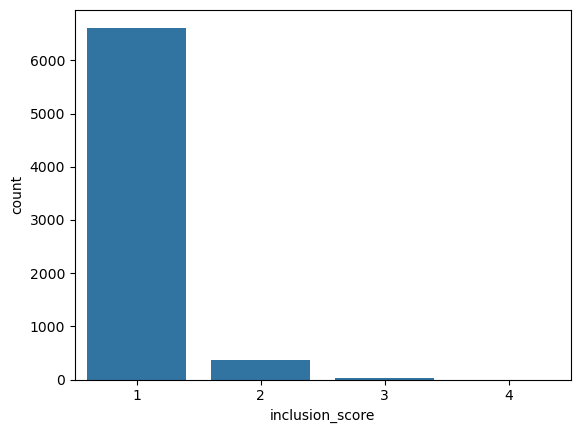

In [53]:
sns.countplot(combined_literature_chembl_w_counts, x="inclusion_score")

In [55]:
import mols2grid
mols2grid.display(combined_literature_chembl_w_counts, smiles_col="CANONICAL_SMILES")

MolGridWidget()